# TorchGEO


En este notebook, se van a realizar una serie de pruebas con la librería $TorchGeo$, para probar su funcionamiento, para ello, primero de todo vamos a instalar la librería $TorchGeo$:

## Instalación de dependencias

In [ ]:
pip install torchgeo

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 381.1/381.1 kB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 825.4/825.4 kB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 745.5/745.5 kB 32.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 41.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.5/21.5 MB 20.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 535.2/535.2 kB 18.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.7/106.7 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 19.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 868.8/868.8 kB 36.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 32.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 13.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━

## Exploración de datos


En este apartado, vamos a reproducir el tutorial definido en la documentación oficial de la librería obtenida de este [enlace](https://torchgeo.readthedocs.io/en/stable/tutorials/getting_started.html).

En primer lugar, importamos las librerías necesarias.

In [ ]:
import os
import tempfile
import numpy as np
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.optim as optim
import torch

from torch.utils.data import DataLoader

from torchgeo.datasets import NAIP, ChesapeakeDE
from torchgeo.datasets.utils import download_url, stack_samples
from torchgeo.samplers import RandomGeoSampler

### DATASET NAIP + CHESAPEAKE

Para esta primera aproximación, vamos utilizar el conjunto de datos [National Agriculture Imagery Program](https://catalog.data.gov/dataset/national-agriculture-imagery-program-naip) que son capturas de imágenes aéreas durante la temporada de crecimiento agrícola en EEUU, y el conjunto de datos de alta resolución de la cuenca del  Chesapeake  Bay por [Chesapeake Bay High-Resolution Land Cover Project](https://www.chesapeakeconservancy.org/conservation-innovation-center/high-resolution-data/land-cover-data-project/) en ellas dos se definen 11 clases:
* 1. **Agua**: Haciendo referencia a cuerpos de agua como ríos, lagos, estangques y arroyos.
* 2. **Humedales**: Áreas que contiene agua como pantanos y ciénagas.
* 3. **Bosque Deciduo**: Zonas con árboles que pierden hojas ocasionalmente.
* 4. **Bosque de Coníferas**: Áreas dominadas por árboles de hoja perenne.
* 5. **Bosque Mixto**: Terrenos con una mezcla de árboles deciduos y coníferos.
* 6. **Praderas/Herbáceas**: Áreas cubiertas por vegetación herbácea.
* 7. **Agricultura**. Terrenos utilizados para la agricultura y pastos para el ganado.
* 8. **Desarrollado**: Áreas que incluyen edificios, carreteras y otras infraestructuras.
* 9. **Área de Interés Ambiental (AIE)**: Zonas designadas para su conservación debido a su importancia ambiental.
* 10. **Superficie no vegetada**: Zonas rocosoas, con arena o suelos expuestos.
* 11. **Áridos**: Áreas con poca vegetación debido a condiciones secas o desérticas.

Ahora, se va a proceder con la descarga de los datos del conjunto de datos de National Agriculture Imagery Program:

In [ ]:
data_root = tempfile.gettempdir()
naip_root = os.path.join(data_root, "naip_train")
naip_url = (
    "https://naipeuwest.blob.core.windows.net/naip/v002/de/2018/de_060cm_2018/38075/"
)
tiles = [
    "m_3807511_ne_18_060_20181104.tif",
    # "m_3807511_se_18_060_20181104.tif",
    # "m_3807512_nw_18_060_20180815.tif",
    # "m_3807512_sw_18_060_20180815.tif",
]
for tile in tiles:
    download_url(naip_url + tile, naip_root)

100%|██████████| 513332284/513332284 [01:08<00:00, 7441554.52it/s] 


Por otro lado, también vamos a descargar los datos del Chesapeake Bay:

In [ ]:
chesapeake_root = os.path.join(data_root, "chesapeake_train")
chesapeake = ChesapeakeDE(chesapeake_root, download=True)

/usr/local/lib/python3.10/dist-packages/torchgeo/datasets/geo.py:313: UserWarning: Could not find any relevant files for provided path '/tmp/chesapeake_train'. Path was ignored.
  warnings.warn(


100%|██████████| 287350495/287350495 [00:07<00:00, 38548024.66it/s]


Una vez descargados los conjuntos de datos, vamos a instanciarlos y mezclarlos. Una vez mezclados, vamos a crear un DataLoader para poder ir obteniendo los datos en batches sin tener que tenerlos cargados todos en memoria al mismo tiempo:

In [ ]:
# Debido a que lo hemos cargado antes, hacemos que primero busque en entorno local
cache = True

# Instanciamos los datasets
chesapeake = ChesapeakeDE(chesapeake_root, cache=cache)
naip = NAIP(naip_root, crs=chesapeake.crs, res=chesapeake.res, cache=cache)

# Creamos un dataset que combine ambos, es decir, se suman.
dataset = chesapeake & naip

# TorchGeo GeoDatasets are indexed using lat/long/time bounding boxes.
# RandomGeoSampler samples elements from a region of interest randomly.
# The "size" parameter specifies the size of the image patch to be extracted.
# "length" specifies the number of patches to be sampled.
sampler = RandomGeoSampler(dataset, size=256, length=10000)

# we combine the dataset and the sampler into a dataloader
# "batch_size" specifies the number of samples to load per batch
# "collate_fn" is a function that specifies how to combine the samples into a batch
dataloader = DataLoader(
    dataset, batch_size=12, sampler=sampler, collate_fn=stack_samples
)

Ahora, vamos a mostrar las dimensiones de las matrices de la imagen y del objetivo que esperamos obtener por el modelo (la detección):

In [ ]:
sample = next(iter(dataloader))
image = sample["image"].numpy().astype(int)
target = sample["mask"].numpy()
image.shape, target.shape

((12, 4, 256, 256), (12, 1, 256, 256))

Como hemos observado, para obtener los valores de la imagen, accedemos a $image$ y a $mask$, pero también podemos acceder a:
* CRS: Sistema de coordenadas de referencia.
* bbox: Frontera.


Como podemos observar a continuación:

In [ ]:
sample.keys()

dict_keys(['crs', 'bbox', 'mask', 'image'])

Ahora, vamos a mostrar una imagen de ejemplo, en este caso vamos a mostra la imagen y su máscara:

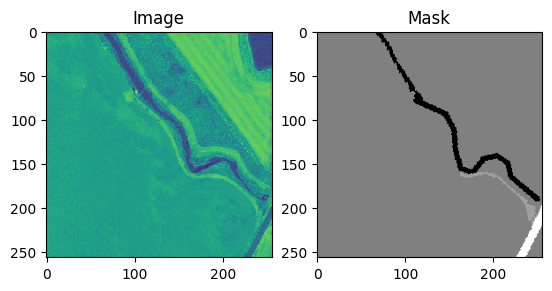

In [ ]:
# Obtenemos la imagen 11º
i = 10
image = sample['image'][i]
mask = sample['mask'][i]

# plot the image and mask
fig, (ax1, ax2) = plt.subplots(ncols=2)
ax1.imshow(image[0,:,:], vmin=0, vmax=255)
ax1.set_title('Image')
ax2.imshow(mask.squeeze(), cmap='gray')
ax2.set_title('Mask')
plt.show()

Ahora, vamos a mostrar algunas características acerca del dataset que tenemos, entre ellas, el número de instancias por clase:

In [ ]:
# Obtenemos la media y STD del valor de los píxeles
image_mean = np.mean(sample['image'].numpy())
image_std = np.std(sample['image'].numpy())

print(f'Image mean: {image_mean:.3f}')
print(f'Image std: {image_std:.3f}')

# Frecuencia de cada clase en las máscaras
classes, counts = np.unique(sample['mask'].numpy(), return_counts=True)

for i, class_name in enumerate(classes):
    print(f'Class {class_name}: {counts[i]} samples')

Image mean: 111.414
Image std: 52.486
Class 1: 11789 samples
Class 2: 539 samples
Class 3: 165825 samples
Class 4: 6114 samples
Class 5: 549624 samples
Class 6: 12897 samples
Class 7: 9643 samples
Class 8: 12479 samples
Class 9: 15745 samples
Class 10: 469 samples
Class 11: 731 samples
Class 12: 577 samples


Donde, como se puede observar, la distribución entre las distintas clases no es equitativa. Es decir, de algunas clases hay muchas instancias (clase 1) y de otras apenas hay (clase 11) en comparación.

Además, se ha calculado la media del valor de los píxeles y su correspondiente desviación típica.

#### Entrenar del modelo

En este apartado, vamos a proceder a entrenar el modelo, para ello, descargamos e instanciamos los datos de entrenamiento:

In [ ]:
data_root = tempfile.gettempdir()
naip_url = (
    "https://naipeuwest.blob.core.windows.net/naip/v002/de/2018/de_060cm_2018/38075/"
)
TILES = [
    "m_3807511_ne_18_060_20181104.tif",
    "m_3807511_se_18_060_20181104.tif",
    "m_3807512_nw_18_060_20180815.tif"
]

cache = True

In [ ]:
# Training set
naip_root = os.path.join(data_root, "naip_train")
download_url(naip_url + TILES[0], naip_root)

chesapeake_root = os.path.join(data_root, "chesapeake")
chesapeake = ChesapeakeDE(chesapeake_root, download=True)

train_chesapeake = ChesapeakeDE(chesapeake_root, cache=cache)
train_naip = NAIP(naip_root, crs=chesapeake.crs,
                  res=chesapeake.res, cache=cache)

train_dataset = train_chesapeake & train_naip
# train_sampler = GridGeoSampler(train_dataset, size=1000, stride=500)
train_sampler = RandomGeoSampler(train_dataset, size=256, length=1000)

train_dataloader = DataLoader(
    train_dataset, batch_size=8, sampler=train_sampler,
    collate_fn=stack_samples,
)

Using downloaded and verified file: /tmp/naip_train/m_3807511_ne_18_060_20181104.tif


/usr/local/lib/python3.10/dist-packages/torchgeo/datasets/geo.py:313: UserWarning: Could not find any relevant files for provided path '/tmp/chesapeake'. Path was ignored.
  warnings.warn(
100%|██████████| 287350495/287350495 [00:05<00:00, 54965998.68it/s]


Y hacemos lo mismo con los datos de validación:

In [ ]:
# Validation set
naip_root = os.path.join(data_root, "naip_val")
download_url(naip_url + TILES[1], naip_root)

val_chesapeake = ChesapeakeDE(chesapeake_root, cache=cache)
val_naip = NAIP(naip_root, crs=chesapeake.crs,
                  res=chesapeake.res, cache=cache)

val_dataset = val_chesapeake & val_naip
val_sampler = RandomGeoSampler(val_dataset, size=256, length=1000)

val_dataloader = DataLoader(
    val_dataset, batch_size=8, sampler=val_sampler,
    collate_fn=stack_samples, shuffle=False,
)

100%|██████████| 521985441/521985441 [00:43<00:00, 11905088.06it/s]


Ahora vamos a definir algunis parámetros de entrenamiento del modelo, los cuales son
* $num\_epoch$: Número de veces que en el entrenamiento el modelo ve el conjunto completo de entrenamiento, se establece a uno debido a limitaciones computacionales de los estudiantes.
* $batch\_size$: Se establece a valor 16, ya que suele ser un estandar establecer valores múltiplos de 2, generalmente valores como 16, 32 y 64 suelen ser relativamente buenos.
* $learning\_rate$: Tamaño de paso.

In [ ]:
num_epochs = 1
batch_size = 16
learning_rate = 0.01

Ahora vamos a instanciar el modelo, el cual va a ser un modelo $Farseg$, estableciendole 12 clases, como se puede observar a continuación:

In [ ]:
from torchgeo.models import FarSeg

# Load the pre-trained ResNet50 model
# Modify the last layer; there are 12 classes + 0 standing for no_data
model = FarSeg(backbone='resnet50', classes=13, backbone_pretrained=True)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 145MB/s]


Ahora, se debe adaptar el modelo para que pueda aceptar una imagen de 4 bandas, lo que hacemos es congelar todas aquellas capas excepto la primera y la última y que requerimos que actualicen sus pesos.

In [ ]:
for name, param in model.named_parameters():
    if not ('conv1' in name or 'fc' in name):
        param.requires_grad = False

# Modify the first layer to accept a 4-band image
model.backbone.conv1 = nn.Conv2d(4, 64, kernel_size=7, stride=2, padding=(3, 3), bias=False)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate)

Y una vez definido el modelo, la función de perdida y el optimizador, procedemos con el entrenamiento del modelo en cuestión:

In [ ]:
from tqdm import tqdm

# Train the model
for epoch in tqdm(range(num_epochs)):
    model.train()
    for i, sample in enumerate(train_dataloader):
        inputs = sample["image"].float()
        labels = sample["mask"]

        optimizer.zero_grad()
        outputs = model(inputs)

        loss = criterion(outputs.view(outputs.shape[0],
                                      outputs.shape[1],-1),
                         labels.view(labels.shape[0],-1),
                         )
        loss.backward()
        optimizer.step()
    print("Epoch {} - Train Loss: {:.4f}".format(epoch, loss.item()))
    path = os.path.join("res",'tl-weights_{}_epochs.pt'.format(epoch))
    torch.save(model.state_dict(), 'res_net_with_naip_chesapeake.pt')

    # Evaluate on validation set
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for sample in val_dataloader:
            inputs = sample["image"].float()
            labels = sample["mask"]
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    print("Validation Accuracy: {:.2f}%".format(100 * (correct/(labels[0].size(1)*labels[0].size(2)*10000))))

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 0 - Train Loss: 2.1064


100%|██████████| 1/1 [26:16<00:00, 1576.93s/it]

Validation Accuracy: 26.15%


Como podemos observar, en el conjunto de validación obtenemos un Accuracy del $37.79\%$.

Una vez entrenado el modelo, vamos a comenzar con la fase de evaluación del mismo. Para ello, descargamos el conjunto de test:

In [ ]:
# Validation set
naip_root = os.path.join(data_root, "naip_test")
download_url(naip_url + TILES[2], naip_root)

test_chesapeake = ChesapeakeDE(chesapeake_root, cache=cache)
test_naip = NAIP(naip_root, crs=chesapeake.crs,
                  res=chesapeake.res, cache=cache)

test_dataset = test_chesapeake & test_naip
test_sampler = RandomGeoSampler(test_dataset, size=256, length=100)

test_dataloader = DataLoader(
    test_dataset, batch_size=8, sampler=test_sampler,
    collate_fn=stack_samples, shuffle=False,
)

100%|██████████| 489865657/489865657 [00:41<00:00, 11899617.18it/s]


Y comenzamos con la evaluación del modelo:

In [ ]:
# Set the model to evaluation mode
model.eval()

# Define the loss function
criterion = nn.CrossEntropyLoss()

# Evaluate on test set
test_loss = 0.0
correct = 0
total = 0
with torch.no_grad():
    for sample in test_dataloader:
        inputs = sample["image"].float()
        labels = sample["mask"]
        outputs = model(inputs)
        loss = criterion(outputs.view(outputs.shape[0], outputs.shape[1], -1), labels.view(labels.shape[0], -1))
        test_loss += loss.item() * inputs.size(0)
        _, predicted = torch.max(outputs.data, 1)
        total += (labels[0].size(1)*labels[0].size(2)*100)
        correct += (predicted == labels).sum().item()

test_loss /= len(test_dataloader.dataset)
print("Test Loss: {:.4f}".format(test_loss))
print("Test Accuracy: {:.2f}%".format(100 * correct / total))


Test Loss: 230.3398
Test Accuracy: 16.37%


In [ ]:
sample = next(iter(test_dataloader))
input = sample['image'].float()
mask = sample['mask'][0]
with torch.no_grad():
  outputs = model(input)



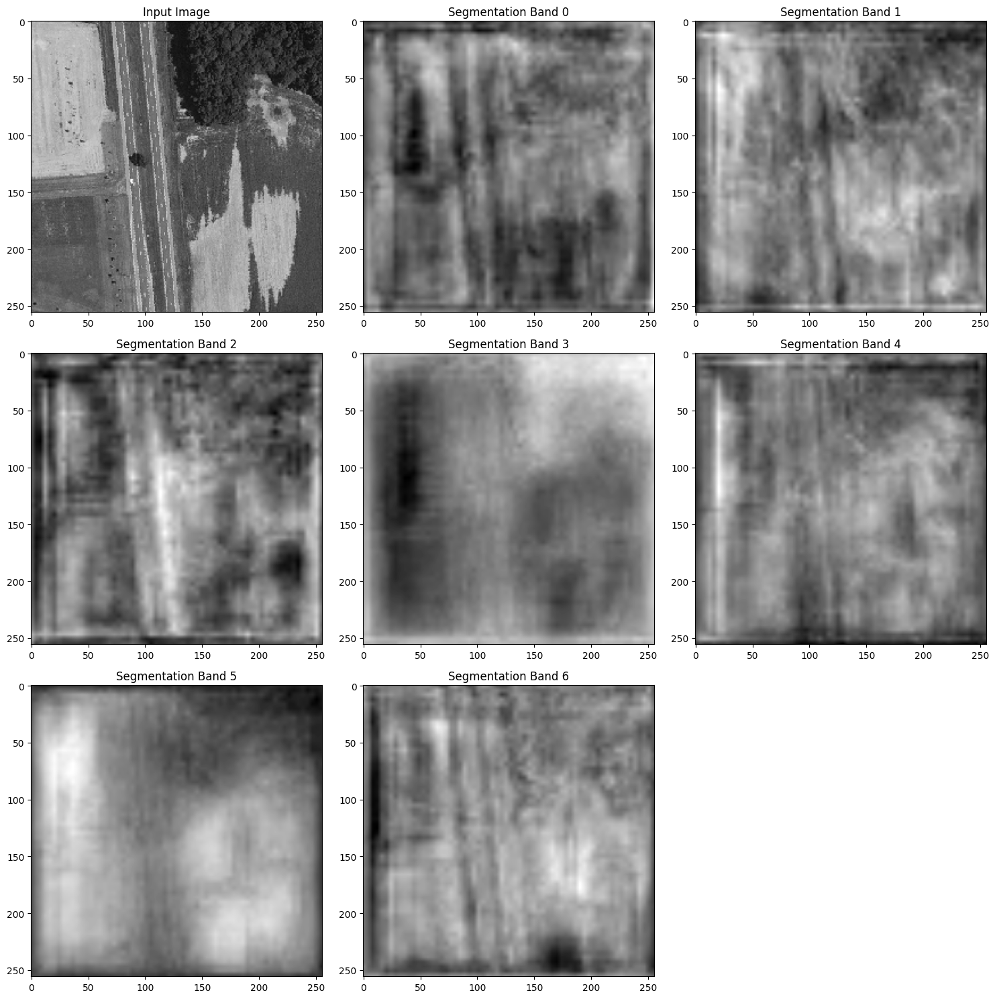

In [ ]:
# Convert tensors to numpy arrays for plotting
input_np = input[0].cpu().numpy()  # Removing batch dimension
output_np = outputs[0].cpu().numpy()  # Removing batch dimension

# Create a figure with a grid of subplots
fig, axes = plt.subplots(3, 3, figsize=(15, 15))

# Plot the input image
axes[0, 0].imshow(input_np.transpose(1, 2, 0) if input_np.shape[0] == 3 else input_np[0], cmap='gray')
axes[0, 0].set_title('Input Image')

# Plot each band of the output
for i in range(8):
    row, col = divmod(i + 1, 3)  # Calculate row and column indices
    axes[row, col].imshow(output_np[i], cmap='gray')
    axes[row, col].set_title(f'Segmentation Band {i}')

# Remove any unused subplots
for j in range(8, 9):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.show()

Donde, como se puede observar, obtenemos un $Accuracy$ en el conjunto de test del $27.85\%$. El cual, es un valor ligeramente inferior al valor obtenido en el conjunto de validación.

### DATASET VHR-10

Basándonos en otro ejemplo para cargar datos, vamos a cargar un conjunto de datos VHR-10 dataset que viene a ser una colección de alta resolución de 10 clases que ha sido proporcionado por la Universidad Politécnica del Noreste de China.


Las clases que son detectadas son :
- Aviones.
- Barcos.
- Tanques de almacenamiento.
- Campos de béisbol.
- Pistas de tenis.
- Pistas de baloncesto.
- Pistas de atletismo.
- Puertos.
- Puentes.
- Vehículos.

El código esta extraído del siguiente dataset.

https://github.com/osgeokr/torchgeo-explained/blob/main/TorchGeo_How_to_Download_the_NWPU_VHR-10_Dataset.ipynb

Ahora, instalamos algunas dependencias:

In [ ]:
%pip install -q -U gdown

In [ ]:
! pip install rarfile

Ahora, vamos a crear una función de preprocesamiento de las imágenes, donde dividiremos entre 255 para normalizar los datos y establecer que el valor de cada pixel se encuentre entre 0 y 1.

Además, vamos a crear el objeto que representa al dataset:

In [ ]:
import torchgeo
from torchgeo.datasets import VHR10

def preprocess(sample):
    sample["image"] = sample["image"].float() / 255.0
    return sample

ds = VHR10(
    root="data/VHR10/",
    split="positive",
    transforms=preprocess,
    download=True,
    checksum=True,
)

Ahora, vamos a proceder con la descarga de los datos:

In [ ]:
import os, gdown

os.makedirs('data/VHR10/', exist_ok=True)

url = 'https://drive.google.com/uc?id=1--foZ3dV5OCsqXQXT84UeKtrAqc5CkAE'
output_path = 'data/VHR10/NWPU VHR-10 dataset.rar'
gdown.download(url, output_path, quiet=False)

Y mostramos algunas características de los mismos:

In [ ]:
print(f"VHR-10 dataset: {len(ds)}")
print(ds[0]["image"].shape)

A continuación, se va a mostrar una de las imágenes del dataset:

In [ ]:
image = ds[200]["image"].permute(1, 2, 0)
plt.imshow(image)
plt.show()

Y ahora vamos a mostrar la misma imagen, pero esta vez mostrando sus etiquetas verdaderas:

In [ ]:
ds.plot(ds[200])
plt.savefig('ground_truth.png', bbox_inches='tight')
plt.show()

A continuación otro ejemplo:

In [ ]:
image = ds[100]["image"].permute(1, 2, 0)
plt.imshow(image)
plt.show()

Junto con su etiqueta verdadera:

In [ ]:
ds.plot(ds[100])
plt.savefig('ground_truth.png', bbox_inches='tight')
plt.show()

Ahora vamos a proceder a entrenar un modelo para detectar dichas etiquetas.

#### Entrenar Modelo

En este apartado, vamos a proceder con el entrenamiento del modelo.

In [ ]:
from torchgeo.datasets import VHR10
from torchgeo.trainers import ObjectDetectionTask
import lightning.pytorch as pl

Primero, vamos a definir el dataloader y la función que procesa cada unos de los batches antes de devolverlos:

In [ ]:
def collate_fn(batch):
    new_batch = {
        "image": [item["image"] for item in batch],  # Images
        "boxes": [item["boxes"] for item in batch],  # Bounding boxes
        "labels": [item["labels"] for item in batch],  # Labels
        "masks": [item["masks"] for item in batch],  # Masks
    }
    return new_batch  # Return the new batch

# Data Loader

dl = DataLoader(
    ds,  # Dataset
    batch_size=8,  # Number of data to load at one time
    num_workers=2,  # Number of processes to use for data loading
    shuffle=True,  # Whether to shuffle the dataset before loading
    collate_fn=collate_fn,  # collate_fn function for batch processing
)

Ahora vamos a definir la función de entrenamiento y, a su vez, algunos parámetros del propio modelo, como valroes del learning rate, el modelo, el número de clases...

In [ ]:
class VariableSizeInputObjectDetectionTask(ObjectDetectionTask):
    # Define the training step
    def training_step(self, batch, batch_idx, dataloader_idx=0):
        x = batch["image"]  # Image
        batch_size = len(x)  # Set batch size (number of images)
        y = [
            {"boxes": batch["boxes"][i], "labels": batch["labels"][i]}
            for i in range(batch_size)
        ] # Extract bounding box and label information for each image
        loss_dict = self(x, y)  # Loss
        train_loss: Tensor = sum(loss_dict.values())  # Training loss (sum of loss values)
        self.log_dict(loss_dict)  # Record loss values
        return train_loss  # Return training loss

task = VariableSizeInputObjectDetectionTask(
    model="faster-rcnn",  # Faster R-CNN model
    backbone="resnet18",  # ResNet18 neural network architecture
    weights=True,  # Use pretrained weights
    in_channels=3,  # Number of channels in the input image (RGB images)
    num_classes=11,  # Number of classes to classify (10 + background)
    trainable_layers=3,  # Number of trainable layers
    lr=1e-3,  # Learning rate
    patience=10,  # Set the number of patience iterations for early stopping
    freeze_backbone=False,  # Whether to train with the backbone network weights unfrozen
)
task.monitor = "loss_classifier"  # Set the metric to monitor (here, the classifier's loss)

Ahora se va a definir como se va a entrenar y cuanto, es decir, indicamos el directorio de logs, donde se va a ejecutar el entrenamiento (T4) y los valores mínimo y máximo de épocas que debe entrenar el modelo:

In [ ]:
trainer = pl.Trainer(
    default_root_dir="logs/",  # Set the default directory
    accelerator="gpu",  # Set the type of hardware accelerator for training (using GPU)
    devices=[0],  # List of device IDs to use ([0] means the first GPU)
    min_epochs=10,  # Set the minimum number of training epochs
    max_epochs=31,  # Set the maximum number of training epochs
    log_every_n_steps=5,  # Set how often to log after a number of steps
)

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


Y finalmente, después de definir todos los parámetros y configuraciones del entrenamiento, entrenamos el modelo, definiendo la task para la cual va a ser entrenado y el dataloader que va a usar. Además, se va a medir el tiempo que tarda este en entrenar:

In [ ]:
%%time
# Model training
trainer.fit(task, train_dataloaders=dl)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name         | Type             | Params
--------------------------------------------------
0 | val_metrics  | MetricCollection | 0     
1 | test_metrics | MetricCollection | 0     
2 | model        | FasterRCNN       | 28.3 M
--------------------------------------------------
28.2 M    Trainable params
156 K     Non-trainable params
28.3 M    Total params
113.280   Total estimated model params size (MB)
INFO:lightning.pytorch.callbacks.model_summary:
  | Name         | Type             | Params
--------------------------------------------------
0 | val_metrics  | MetricCollection | 0     
1 | test_metrics | MetricCollection | 0     
2 | model        | FasterRCNN       | 28.3 M
--------------------------------------------------
28.2 M    Trainable params
156 K     Non-trainable params
28.3 M    Total params
113.280   Total estimated model params 

Training: |          | 0/? [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=31` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=31` reached.


CPU times: user 53min 40s, sys: 2min 4s, total: 55min 44s
Wall time: 1h 1min 50s


Donde, como se puede observar, el modelo finalmente posee 28.3M de parámetros y ha estado entrenando durante 31 épocas, alcanzando el máximo que le hemos indicado. Este entrenamiento ha tardado en total, 1h 1m y 50s.

Una vez el modelo ha sido entrenado, se va a proceder con la evaluación del mismo

#### Inferencia con Modelo

En este apartado, vamos a evaluar el modelo entrenado anteriormente, para ello, vamos a ponerlo en modo evaluación para que los pesos se congelen y no continue con la fase de entrenamiento y, posteriormente, vamos a pasarle un batch de imágenes para que prediga y almacene en la variable $out$:

In [ ]:
batch = next(iter(dl))

In [ ]:
model = task.model
model.eval()

with torch.no_grad():
  out = model(batch["image"])

Ahora, vamos a crearnos una función para que en función de un batch de imagenes, nos devuelva algunos parámetros en formato diccionario que necesitamos para la comparación entre las etiquetas verdaderas y las predichas, la variable out representa la respeusta del modelo, batch la secuencia predicha por el modelo y batch_idx el índice del batch del cual queremos obtener dichos parámetros:

In [ ]:
def create_sample(batch, out, batch_idx):
    return {
        "image": batch["image"][batch_idx],  # Image
        "boxes": batch["boxes"][batch_idx],  # Actual bounding boxes
        "labels": batch["labels"][batch_idx],  # Actual labels
        "masks": batch["masks"][batch_idx],  # Actual masks
        "prediction_labels": out[batch_idx]["labels"],  # Labels predicted by the model
        "prediction_boxes": out[batch_idx]["boxes"],  # Bounding boxes predicted by the model
        "prediction_scores": out[batch_idx]["scores"],  # Confidence scores for each prediction
    }



De forma que, vamos a mostrar algunos ejemplos de las predicciones del modelo, donde a la izquierda mostraremos la etiqueta verdadera de la imagen y, a la derecha, la predicción de nuestro modelo:

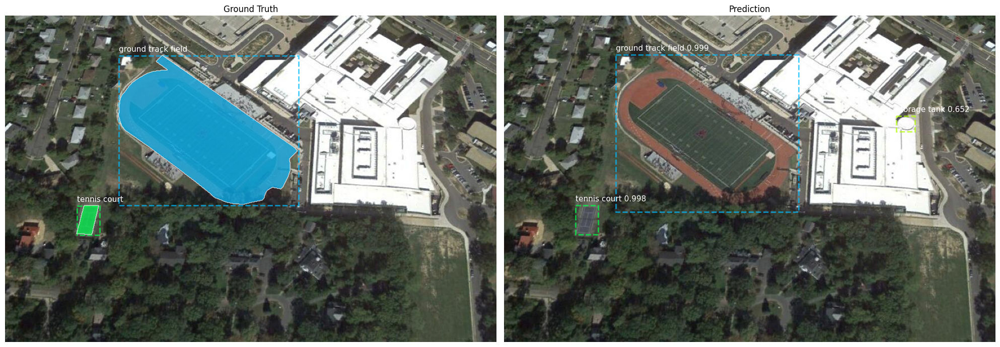

In [ ]:
batch_idx = 0
sample = create_sample(batch, out, batch_idx)
ds.plot(sample)
plt.savefig('inference.png', bbox_inches='tight')
plt.show()

Donde, como podemos observar, en esta imagen es bastante preciso, ya que detecta con bastante confianza tanto la pista de tenis como la pista de atletismo.

Sin embargo, en la predicción, podemos observar que a la derecha predice con un $0.652$ de confianza un tanque de almacenamiento, lo cual es incorrecto y simplemente es una torre del edificio. Aunque el modelo falle, hasta un humano quizá podría confundirse ya que la forma es bastante similar.

Ahora, vamos a mostrar otra de las predicciones del modelo:

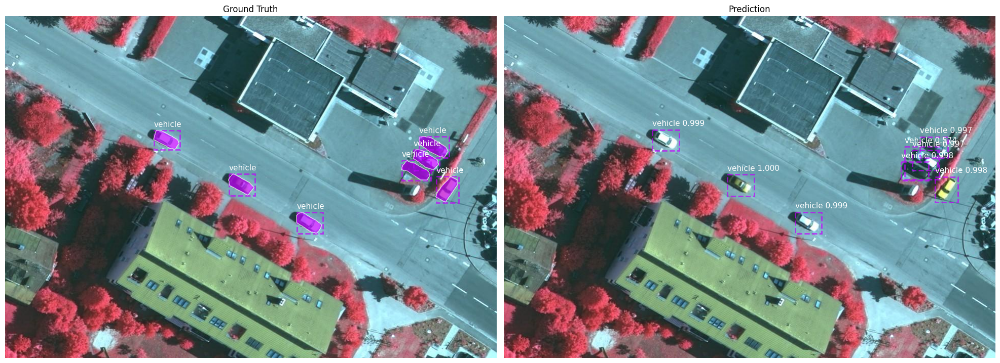

In [ ]:
# Visualizing Sample for Batch Index 5
batch_idx = 1
sample = create_sample(batch, out, batch_idx)

ds.plot(sample)
plt.show()

En este caso, la detección de objetos se ha basado en vehículos, donde, como se puede observar anteriormente, el modelo es capaz de detectar los 6 vehículos perfectamente y todos con una confianza superior al $0.99$ en todos los casos.

Vamos a observar a continuación otra imagen de vehículos:

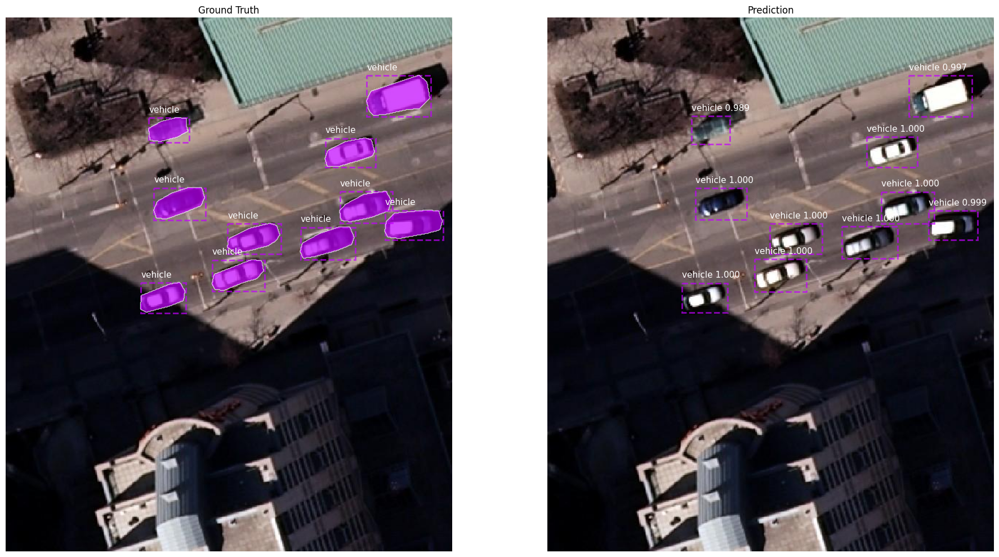

In [ ]:
# Visualizing Sample for Batch Index 5
batch_idx = 2
sample = create_sample(batch, out, batch_idx)

ds.plot(sample)
plt.show()

Donde, de nuevo, el modelo es capaz de predecir todos los vehículos con una gran confianza, incluso el que parece estar aparcado en la parte superior izquierda, que hay un poco de ruido debido a que parece haber unas ramas de árbol encima. Por otro lado, también es capaz de detectar lo que parece un furgón en la parte superior derecha. Todo eso con confianzas aproximadamente de $99\%$ o superior.

Ahora vamos a mostrar una imagen satelital en la cual se encuentra una cancha de beisbol, para observar si el modelo es capaz dedetectarla:

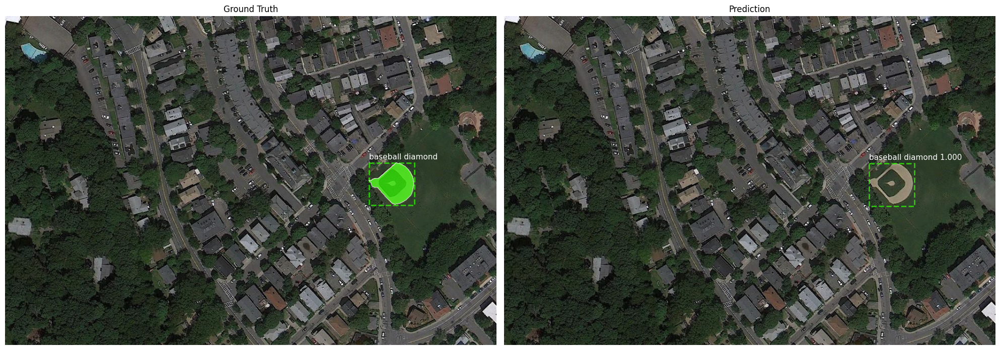

In [ ]:
# Visualizing Sample for Batch Index 5
batch_idx = 3
sample = create_sample(batch, out, batch_idx)

ds.plot(sample)
plt.show()

Como podemos observar en la imagen anterior, el modelo es capaz de detectarla y señalarla, además, con una confianza del $100\%$.


A continuación, vamos a mostrar una imagen de un puerto, donde hay multitud de amarres, para observar si el modelo es capaz de detectarlos:

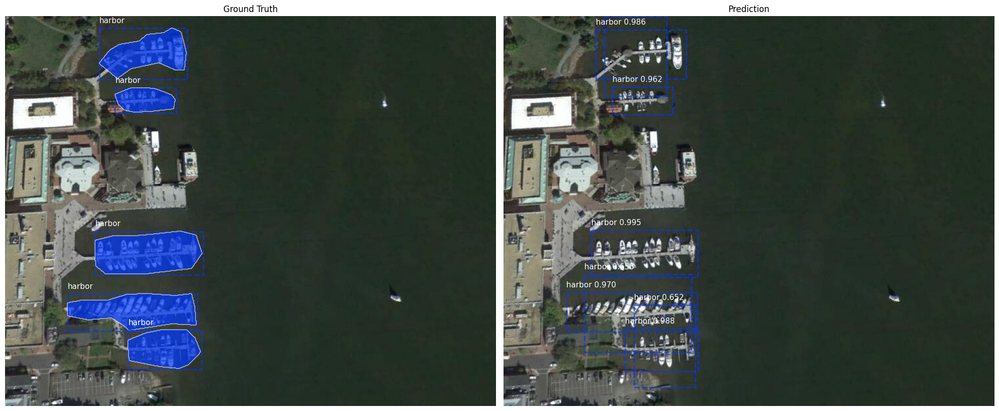

In [ ]:
# Visualizing Sample for Batch Index 5
batch_idx = 4
sample = create_sample(batch, out, batch_idx)

ds.plot(sample)
plt.show()

Como podemos observar, el modelo es capaz de detectar todos los amarres, sin embargo, en la parte inferior, donde se encuentran 3 muy próximos, el modelo detecta 5. Esto probablemente se deba a que, debido a la proximidad de los mismos no es capaz de detectarlos, por lo que detecta uno más en las intersecciones entre los distintos amarres.

De igual forma,  los que según la etiqueta real son los correctos, es capaz de predecirlos con una confianza de alrededor del $97\%$, mientras que, los que son erróneos, les asigna unas probabilidades de alrededor del $65\%$, por lo que, si atribuimos un filtro para que solo muestre los objetos de los que está muy seguro, estos se eliminarían. Podríamos establecer un umbral de, por ejemplo, el $80\%$, para que solo se muestren las etiquetas de las que el modelo tiene más de ese umbral de confianza. De esta forma, los valores erróneos en esta imagen desaparecerían.



Por otro lado, ahora se va a mostrar una imagen satelital de un aeropuerto, así, vamos a verificar si el modelo es capaz de detectar también aviones, observamos las imágenes a continuación:

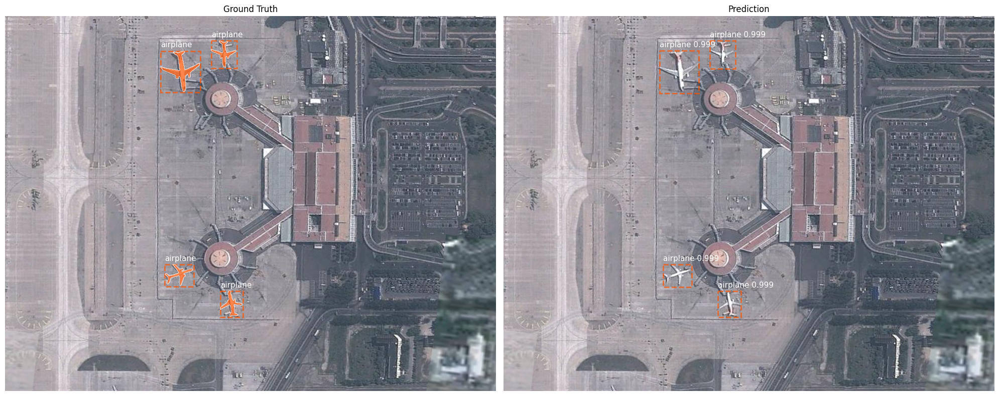

In [ ]:
# Visualizing Sample for Batch Index 5
batch_idx = 5
sample = create_sample(batch, out, batch_idx)

ds.plot(sample)
plt.show()

Como podemos observar, comparando la imagen real con la predicción, el modelo es capaz de detectar perfectamente los aviones. De hecho, todos ellos los detecta con una confianza de $0.999$, por lo que el modelo está bastante seguro y, además, acierta.


Ahora se va a mostrar si el modelo es capaz de detectar multitud de pistas de tenis muy cercanas entre sí, o este se confunde, debido a la proximidad de las mismas, como hemos observado en el caso de los amarres del puerto anteriormente:

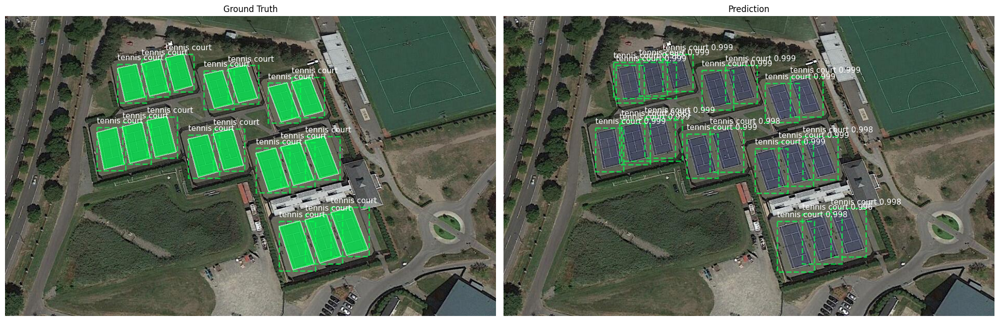

In [ ]:
# Visualizing Sample for Batch Index 5
batch_idx = 6
sample = create_sample(batch, out, batch_idx)

ds.plot(sample)
plt.show()

Como podemos observar, el modelo es capaz de predecir todas las pistas de tenis, sin equivocarse en ninguna. Sin embargo, si observamos en las pistas superiores, vemos que en ocasiones dibuja 2 estelas para una misma pista de tenis. Por lo que, de nuevo, el modelo obtiene más pistas de tenis de las que realmente existen, pero es capaz de posicionar las que hay correctamente.

De hecho, si separamos un poco las pistas de tenis, como vamos a observar en la siguiente imagen:

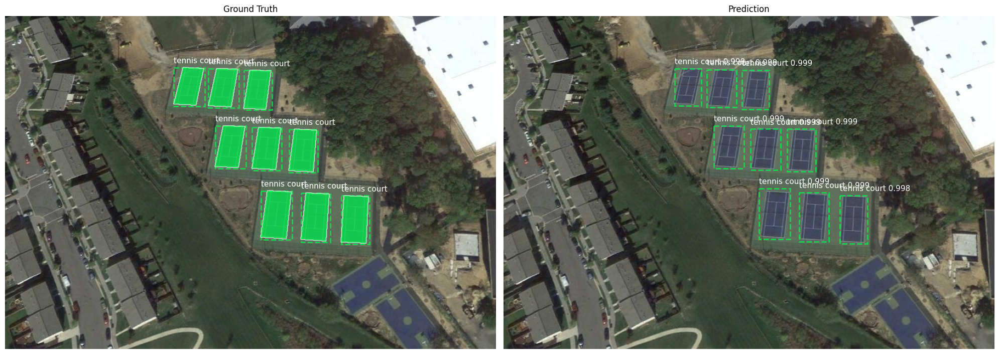

In [ ]:
# Visualizing Sample for Batch Index 5
batch_idx = 7
sample = create_sample(batch, out, batch_idx)

ds.plot(sample)
plt.show()

El modelo es capaz de predecirlas todas correctamente, sin sobreestimar y situandolas correctamente en el mapa, con unas confianzas bastante próximas a 1 en todas ellas.